In [1]:
import pandas as pd
import numpy as np
import scipy
import yfinance as yf
import matplotlib.pyplot as plt

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
raw_data = pd.read_csv('CBOE SPX Options.csv')

raw_data

,underlying_symbol,quote_datetime,root,expiration,strike,option_type,open,high,low,close,trade_volume,bid_size,bid,ask_size,ask,underlying_bid,underlying_ask,implied_underlying_price,active_underlying_price,implied_volatility,delta,gamma,theta,vega,rho
0,^SPX,2024-08-05 09:31:00,SPX,2024-08-16,200.0,C,0.0,0.0,0.0,0.0,0,5,4910.4,5,4934.4,5108.43,5130.85,0.0,5119.640,8.2588,0.9986,0.0000,-0.6506,0.0412,0.0727
1,^SPX,2024-08-05 09:32:00,SPX,2024-08-16,200.0,C,0.0,0.0,0.0,0.0,0,5,4914.2,5,4938.2,5115.93,5135.57,0.0,5125.750,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,^SPX,2024-08-05 09:33:00,SPX,2024-08-16,200.0,C,0.0,0.0,0.0,0.0,0,5,4912.7,5,4936.7,5112.79,5132.15,0.0,5122.470,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,^SPX,2024-08-05 09:34:00,SPX,2024-08-16,200.0,C,0.0,0.0,0.0,0.0,0,5,4928.6,32,4951.9,5130.57,5148.24,0.0,5139.405,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,^SPX,2024-08-05 09:35:00,SPX,2024-08-16,200.0,C,0.0,0.0,0.0,0.0,0,5,4926.7,5,4950.7,5128.27,5143.36,0.0,5135.815,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10063435,^SPX,2024-08-05 16:11:00,SPXW,2025-06-30,7600.0,P,0.0,0.0,0.0,0.0,0,0,0.0,1,4277.4,5154.06,5266.75,0.0,5210.405,0.2342,-0.9273,0.0001,0.0000,7.1972,-62.8133
10063436,^SPX,2024-08-05 16:12:00,SPXW,2025-06-30,7600.0,P,0.0,0.0,0.0,0.0,0,1,2089.3,1,2169.3,5159.01,5265.41,0.0,5212.210,0.2318,-0.9300,0.0001,0.0000,7.0134,-62.9240
10063437,^SPX,2024-08-05 16:13:00,SPXW,2025-06-30,7600.0,P,0.0,0.0,0.0,0.0,0,1,2093.0,1,2173.0,5160.50,5265.77,0.0,5213.135,0.2349,-0.9270,0.0001,0.0000,7.2130,-62.8042
10063438,^SPX,2024-08-05 16:14:00,SPXW,2025-06-30,7600.0,P,0.0,0.0,0.0,0.0,0,1,2096.2,1,2176.2,5150.33,5258.95,0.0,5204.640,0.2286,-0.9343,0.0001,0.0000,6.6996,-63.1001


In [4]:
raw_data.columns

Index(['underlying_symbol', 'quote_datetime', 'root', 'expiration', 'strike',
       'option_type', 'open', 'high', 'low', 'close', 'trade_volume',
       'bid_size', 'bid', 'ask_size', 'ask', 'underlying_bid',
       'underlying_ask', 'implied_underlying_price', 'active_underlying_price',
       'implied_volatility', 'delta', 'gamma', 'theta', 'vega', 'rho'],
      dtype='object')

In [5]:
df = raw_data.copy()
options_traded = df.loc[df['trade_volume']>=1]

options_traded

,underlying_symbol,quote_datetime,root,expiration,strike,option_type,open,high,low,close,trade_volume,bid_size,bid,ask_size,ask,underlying_bid,underlying_ask,implied_underlying_price,active_underlying_price,implied_volatility,delta,gamma,theta,vega,rho
219,^SPX,2024-08-05 13:10:00,SPX,2024-08-16,200.0,C,5005.19,5005.19,5005.19,5005.19,2,28,5001.50,28,5007.90,5207.27,5211.33,0.0,5209.300,7.4902,0.9993,0.0000,0.0000,0.0229,0.0500
220,^SPX,2024-08-05 13:11:00,SPX,2024-08-16,200.0,C,5010.21,5010.21,5007.09,5007.09,10,28,5005.30,28,5011.80,5210.03,5214.08,0.0,5212.055,6.8423,0.9997,0.0000,0.0000,0.0123,0.0510
6134,^SPX,2024-08-05 10:30:00,SPX,2024-08-16,1600.0,P,0.43,0.43,0.33,0.33,2,10,0.05,75,0.75,5160.15,5165.49,0.0,5162.820,2.2586,-0.0007,0.0000,-0.1775,0.0213,-0.0012
6171,^SPX,2024-08-05 11:07:00,SPX,2024-08-16,1600.0,P,0.05,0.05,0.05,0.05,10,0,0.00,90,0.05,5185.57,5190.43,0.0,5188.000,1.8620,-0.0001,0.0000,-0.0141,0.0023,-0.0001
6426,^SPX,2024-08-05 15:22:00,SPX,2024-08-16,1600.0,P,0.05,0.05,0.05,0.05,1,0,0.00,90,0.05,5175.63,5178.35,0.0,5176.990,1.8744,-0.0001,0.0000,-0.0143,0.0023,-0.0001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10054098,^SPX,2024-08-05 15:49:00,SPXW,2025-06-30,6200.0,C,50.24,50.24,50.24,50.24,1,15,48.40,15,51.80,5164.17,5166.08,0.0,5165.125,0.1433,0.1513,0.0003,-0.2377,11.7419,6.4924
10054908,^SPX,2024-08-05 15:49:00,SPXW,2025-06-30,6250.0,C,43.14,43.14,43.14,43.14,1,16,41.50,35,44.80,5164.17,5166.08,0.0,5165.125,0.1418,0.1351,0.0003,-0.2179,10.9212,5.8085
10056497,^SPX,2024-08-05 15:18:00,SPXW,2025-06-30,6400.0,C,26.60,26.60,26.60,26.60,1,14,25.20,59,27.70,5168.34,5170.96,0.0,5169.650,0.1371,0.0920,0.0003,-0.1602,8.4562,3.9802
10057087,^SPX,2024-08-05 11:38:00,SPXW,2025-06-30,6500.0,C,19.05,19.05,19.05,19.05,1,59,14.50,63,22.40,5230.30,5235.10,0.0,5232.700,0.1284,0.0744,0.0002,-0.1293,7.4061,3.2715


## 로그 행사가격 column 추가 후 C/P 분리해서 csv로 저장

In [6]:
from scipy.optimize import curve_fit

def calculate_log_strike(row):
    """
    로그 행사가격 계산
    """
    return np.log(row['strike'] / row['active_underlying_price'])

options_traded['log_strike'] = options_traded.apply(calculate_log_strike, axis=1)

/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_8443/280083642.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  options_traded['log_strike'] = options_traded.apply(calculate_log_strike, axis=1)


In [7]:
options_traded

,underlying_symbol,quote_datetime,root,expiration,strike,option_type,open,high,low,close,trade_volume,bid_size,bid,ask_size,ask,underlying_bid,underlying_ask,implied_underlying_price,active_underlying_price,implied_volatility,delta,gamma,theta,vega,rho,log_strike
219,^SPX,2024-08-05 13:10:00,SPX,2024-08-16,200.0,C,5005.19,5005.19,5005.19,5005.19,2,28,5001.50,28,5007.90,5207.27,5211.33,0.0,5209.300,7.4902,0.9993,0.0000,0.0000,0.0229,0.0500,-3.259883
220,^SPX,2024-08-05 13:11:00,SPX,2024-08-16,200.0,C,5010.21,5010.21,5007.09,5007.09,10,28,5005.30,28,5011.80,5210.03,5214.08,0.0,5212.055,6.8423,0.9997,0.0000,0.0000,0.0123,0.0510,-3.260412
6134,^SPX,2024-08-05 10:30:00,SPX,2024-08-16,1600.0,P,0.43,0.43,0.33,0.33,2,10,0.05,75,0.75,5160.15,5165.49,0.0,5162.820,2.2586,-0.0007,0.0000,-0.1775,0.0213,-0.0012,-1.171479
6171,^SPX,2024-08-05 11:07:00,SPX,2024-08-16,1600.0,P,0.05,0.05,0.05,0.05,10,0,0.00,90,0.05,5185.57,5190.43,0.0,5188.000,1.8620,-0.0001,0.0000,-0.0141,0.0023,-0.0001,-1.176345
6426,^SPX,2024-08-05 15:22:00,SPX,2024-08-16,1600.0,P,0.05,0.05,0.05,0.05,1,0,0.00,90,0.05,5175.63,5178.35,0.0,5176.990,1.8744,-0.0001,0.0000,-0.0143,0.0023,-0.0001,-1.174220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10054098,^SPX,2024-08-05 15:49:00,SPXW,2025-06-30,6200.0,C,50.24,50.24,50.24,50.24,1,15,48.40,15,51.80,5164.17,5166.08,0.0,5165.125,0.1433,0.1513,0.0003,-0.2377,11.7419,6.4924,0.182620
10054908,^SPX,2024-08-05 15:49:00,SPXW,2025-06-30,6250.0,C,43.14,43.14,43.14,43.14,1,16,41.50,35,44.80,5164.17,5166.08,0.0,5165.125,0.1418,0.1351,0.0003,-0.2179,10.9212,5.8085,0.190652
10056497,^SPX,2024-08-05 15:18:00,SPXW,2025-06-30,6400.0,C,26.60,26.60,26.60,26.60,1,14,25.20,59,27.70,5168.34,5170.96,0.0,5169.650,0.1371,0.0920,0.0003,-0.1602,8.4562,3.9802,0.213493
10057087,^SPX,2024-08-05 11:38:00,SPXW,2025-06-30,6500.0,C,19.05,19.05,19.05,19.05,1,59,14.50,63,22.40,5230.30,5235.10,0.0,5232.700,0.1284,0.0744,0.0002,-0.1293,7.4061,3.2715,0.216875


In [8]:
options_traded.to_csv('options_traded.csv')

In [9]:
options_traded_call = options_traded.loc[df['option_type']=='C']

options_traded_call

,underlying_symbol,quote_datetime,root,expiration,strike,option_type,open,high,low,close,trade_volume,bid_size,bid,ask_size,ask,underlying_bid,underlying_ask,implied_underlying_price,active_underlying_price,implied_volatility,delta,gamma,theta,vega,rho,log_strike
219,^SPX,2024-08-05 13:10:00,SPX,2024-08-16,200.0,C,5005.19,5005.19,5005.19,5005.19,2,28,5001.5,28,5007.9,5207.27,5211.33,0.0,5209.300,7.4902,0.9993,0.0000,0.0000,0.0229,0.0500,-3.259883
220,^SPX,2024-08-05 13:11:00,SPX,2024-08-16,200.0,C,5010.21,5010.21,5007.09,5007.09,10,28,5005.3,28,5011.8,5210.03,5214.08,0.0,5212.055,6.8423,0.9997,0.0000,0.0000,0.0123,0.0510,-3.260412
25144,^SPX,2024-08-05 10:05:00,SPX,2024-08-16,3200.0,C,2015.90,2015.90,2015.90,2015.90,1,12,2008.0,12,2022.4,5204.06,5211.07,0.0,5207.565,1.2937,0.9889,0.0000,-1.0856,0.2654,0.9462,-0.486962
25172,^SPX,2024-08-05 10:33:00,SPX,2024-08-16,3200.0,C,1983.55,1983.55,1983.55,1983.55,1,12,1968.1,12,1976.0,5161.60,5167.10,0.0,5164.350,1.2731,0.9888,0.0000,-1.0653,0.2638,0.9439,-0.478628
51108,^SPX,2024-08-05 10:49:00,SPX,2024-08-16,4000.0,C,1186.71,1186.71,1186.71,1186.71,700,12,1197.4,12,1204.8,5184.16,5189.19,0.0,5186.675,0.8814,0.9623,0.0001,-2.6043,0.7387,1.1386,-0.259798
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10054098,^SPX,2024-08-05 15:49:00,SPXW,2025-06-30,6200.0,C,50.24,50.24,50.24,50.24,1,15,48.4,15,51.8,5164.17,5166.08,0.0,5165.125,0.1433,0.1513,0.0003,-0.2377,11.7419,6.4924,0.182620
10054908,^SPX,2024-08-05 15:49:00,SPXW,2025-06-30,6250.0,C,43.14,43.14,43.14,43.14,1,16,41.5,35,44.8,5164.17,5166.08,0.0,5165.125,0.1418,0.1351,0.0003,-0.2179,10.9212,5.8085,0.190652
10056497,^SPX,2024-08-05 15:18:00,SPXW,2025-06-30,6400.0,C,26.60,26.60,26.60,26.60,1,14,25.2,59,27.7,5168.34,5170.96,0.0,5169.650,0.1371,0.0920,0.0003,-0.1602,8.4562,3.9802,0.213493
10057087,^SPX,2024-08-05 11:38:00,SPXW,2025-06-30,6500.0,C,19.05,19.05,19.05,19.05,1,59,14.5,63,22.4,5230.30,5235.10,0.0,5232.700,0.1284,0.0744,0.0002,-0.1293,7.4061,3.2715,0.216875


In [10]:
options_traded_call.to_csv('options_traded_call.csv')

In [11]:
options_traded_put = options_traded.loc[df['option_type']=='P']

options_traded_put

,underlying_symbol,quote_datetime,root,expiration,strike,option_type,open,high,low,close,trade_volume,bid_size,bid,ask_size,ask,underlying_bid,underlying_ask,implied_underlying_price,active_underlying_price,implied_volatility,delta,gamma,theta,vega,rho,log_strike
6134,^SPX,2024-08-05 10:30:00,SPX,2024-08-16,1600.0,P,0.43,0.43,0.33,0.33,2,10,0.05,75,0.75,5160.15,5165.49,0.0,5162.820,2.2586,-0.0007,0.0000,-0.1775,0.0213,-0.0012,-1.171479
6171,^SPX,2024-08-05 11:07:00,SPX,2024-08-16,1600.0,P,0.05,0.05,0.05,0.05,10,0,0.00,90,0.05,5185.57,5190.43,0.0,5188.000,1.8620,-0.0001,0.0000,-0.0141,0.0023,-0.0001,-1.176345
6426,^SPX,2024-08-05 15:22:00,SPX,2024-08-16,1600.0,P,0.05,0.05,0.05,0.05,1,0,0.00,90,0.05,5175.63,5178.35,0.0,5176.990,1.8744,-0.0001,0.0000,-0.0143,0.0023,-0.0001,-1.174220
6463,^SPX,2024-08-05 15:59:00,SPX,2024-08-16,1600.0,P,0.05,0.05,0.05,0.05,1,0,0.00,89,0.05,5183.22,5184.76,0.0,5183.990,1.8787,-0.0001,0.0000,-0.0143,0.0023,-0.0001,-1.175571
7709,^SPX,2024-08-05 09:45:00,SPX,2024-08-16,1900.0,P,0.95,0.95,0.95,0.95,1,1,0.05,216,3.70,5148.28,5159.04,0.0,5153.660,2.2429,-0.0029,0.0000,-0.6863,0.0781,-0.0049,-0.997853
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10031504,^SPX,2024-08-05 10:30:00,SPXW,2025-06-30,5450.0,P,420.00,420.00,420.00,420.00,1,4,412.30,4,432.50,5160.15,5165.49,0.0,5162.820,0.1855,-0.5157,0.0004,-0.4826,19.4043,-27.6216,0.054133
10031528,^SPX,2024-08-05 10:54:00,SPXW,2025-06-30,5450.0,P,405.81,405.81,405.81,405.81,1,7,397.50,7,411.50,5196.57,5201.76,0.0,5199.165,0.1849,-0.5013,0.0004,-0.4875,19.5339,-26.9579,0.047118
10031545,^SPX,2024-08-05 11:11:00,SPXW,2025-06-30,5450.0,P,397.79,397.79,397.79,397.79,1,7,389.00,7,400.90,5205.20,5210.12,0.0,5207.660,0.1818,-0.4992,0.0005,-0.4808,19.5691,-26.8078,0.045485
10032355,^SPX,2024-08-05 11:11:00,SPXW,2025-06-30,5475.0,P,407.39,407.39,407.39,407.39,1,7,398.70,7,411.90,5205.20,5210.12,0.0,5207.660,0.1801,-0.5104,0.0005,-0.4740,19.5683,-27.4220,0.050062


In [12]:
options_traded_put.to_csv('options_traded_put.csv')

## Vol Smile

근데 그리려면 만기 같은 것끼리 묶어야해

In [13]:
expiration_counts_call = options_traded_call['expiration'].value_counts()


print(expiration_counts_call)


expiration
2024-08-05    18827
2024-08-06     9018
2024-08-16     4805
2024-08-09     4566
2024-09-20     4556
2024-08-07     3468
2024-08-12     2456
2024-10-18     1963
2024-08-30     1623
2024-08-08     1565
2024-08-23     1017
2024-12-20     1016
2024-11-15      852
2024-08-19      751
2024-09-06      595
2024-09-30      527
2025-06-20      489
2024-08-14      476
2024-08-13      394
2024-08-15      382
2025-03-21      360
2024-10-31      309
2025-01-17      306
2024-08-26      301
2024-12-31      281
2024-09-13      275
2024-08-21      220
2024-09-27      212
2024-08-20      209
2024-08-28      205
2025-02-21      189
2024-08-22      187
2024-08-27      186
2024-08-29      158
2025-09-19      156
2024-09-04      154
2024-09-03      139
2025-05-16      138
2025-03-31      132
2025-04-17      106
2025-12-19      104
2024-11-29       92
2025-07-18       72
2024-09-16       65
2024-09-09       64
2024-09-11       57
2024-09-10       48
2024-09-05       42
2025-08-15       30
2025-01-3

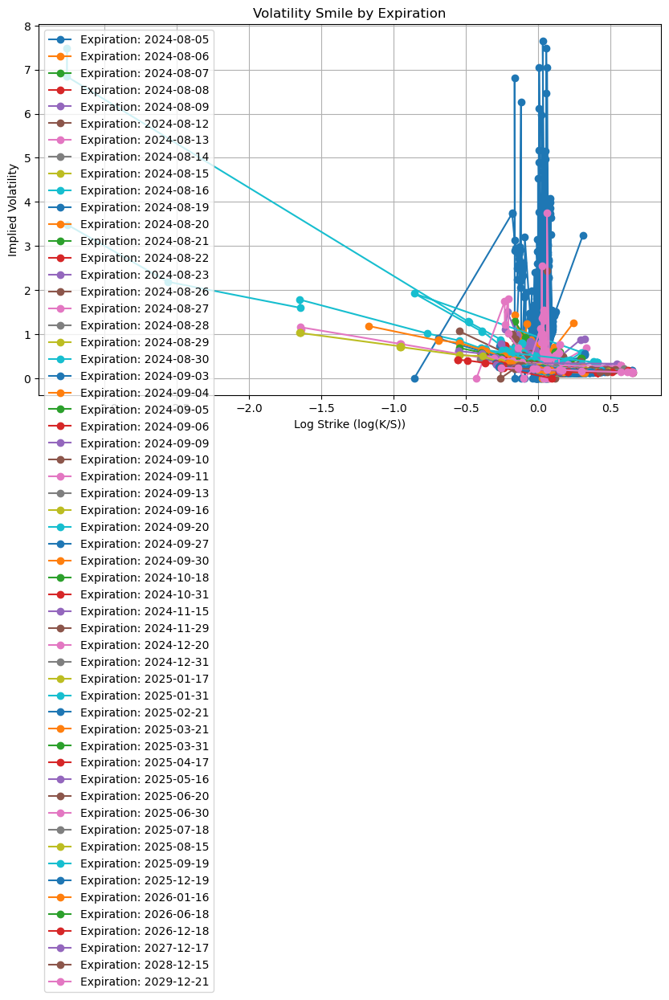

In [14]:
# 만기일을 기준으로 그룹화
grouped = options_traded_call.groupby('expiration')

plt.figure(figsize=(10, 6))

# 각 만기에 대한 vol smile
for name, group in grouped:
    plt.plot(group['log_strike'], group['implied_volatility'], marker='o', linestyle='-', label=f'Expiration: {name}')


plt.title('Volatility Smile by Expiration')
plt.xlabel('Log Strike (log(K/S))')
plt.ylabel('Implied Volatility')
plt.legend()
plt.grid(True)

plt.show()


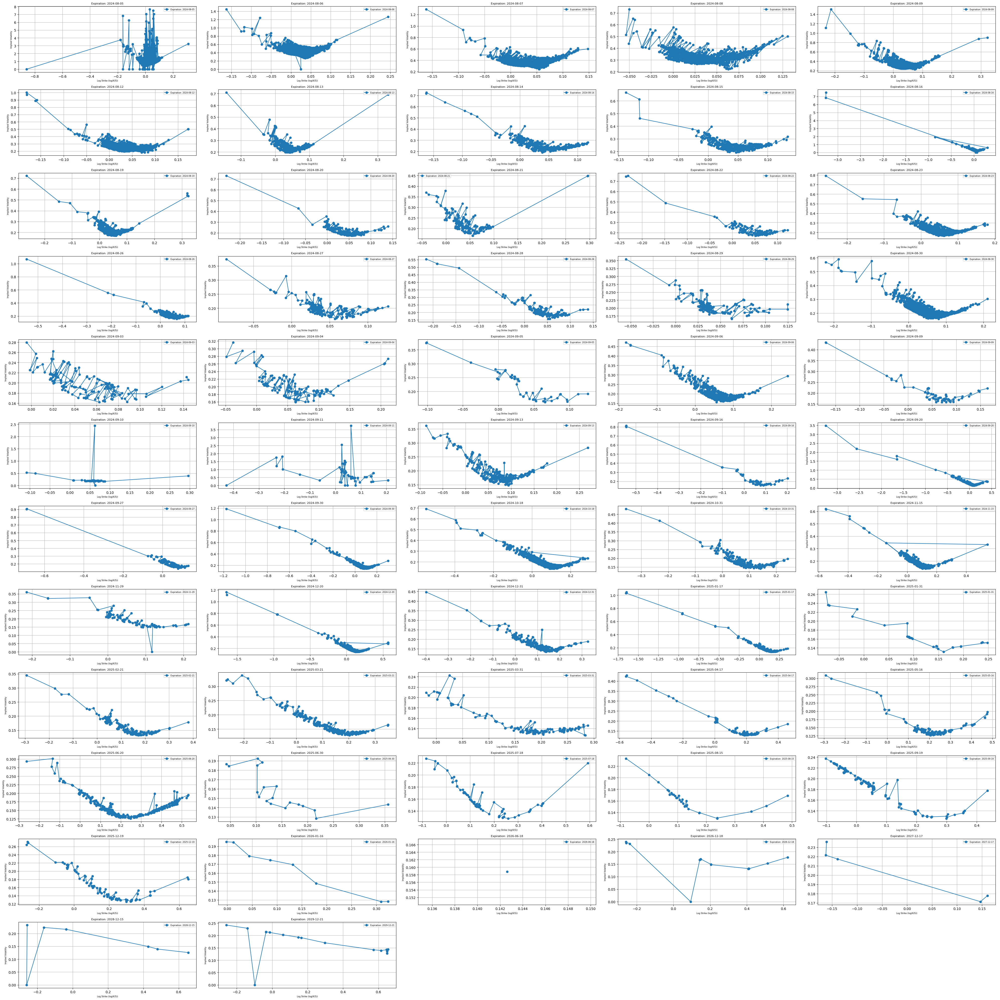

In [15]:
# 만기일을 기준으로 그룹화
grouped =options_traded_call.groupby('expiration')

# 총 그래프 개수 설정
n_groups = len(grouped)
ncols = 5
nrows = (n_groups // ncols) + (n_groups % ncols > 0)

# 플롯 크기 설정
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 40))
axes = axes.flatten()  # 그래프를 1D 배열로 변환

# 각 그룹별로 개별 그래프 생성
for i, (name, group) in enumerate(grouped):
    ax = axes[i]
    ax.plot(group['log_strike'], group['implied_volatility'], marker='o', linestyle='-', label=f'Expiration: {name}')
    ax.set_title(f'Expiration: {name}', fontsize=8)
    ax.set_xlabel('Log Strike (log(K/S))', fontsize=6)
    ax.set_ylabel('Implied Volatility', fontsize=6)
    ax.grid(True)
    ax.legend(fontsize=6)

# 남는 플롯은 빈 화면으로 설정
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


변동성 곡선이 불규칙하다면, 특정 행사가격에 대해 지나치게 높은 또는 낮은 가격이 책정될 수 있는데, 이는 비합리적이거나 일관성 없는 변동성 곡선을 의미할 수 있음  
매끄러운 변동성 곡선을 사용하면, 헤징 전략이 더 효과적임 -> SVI로 vol smile을 convex하게 만들고, 그 이후에 헤징 전략 활용

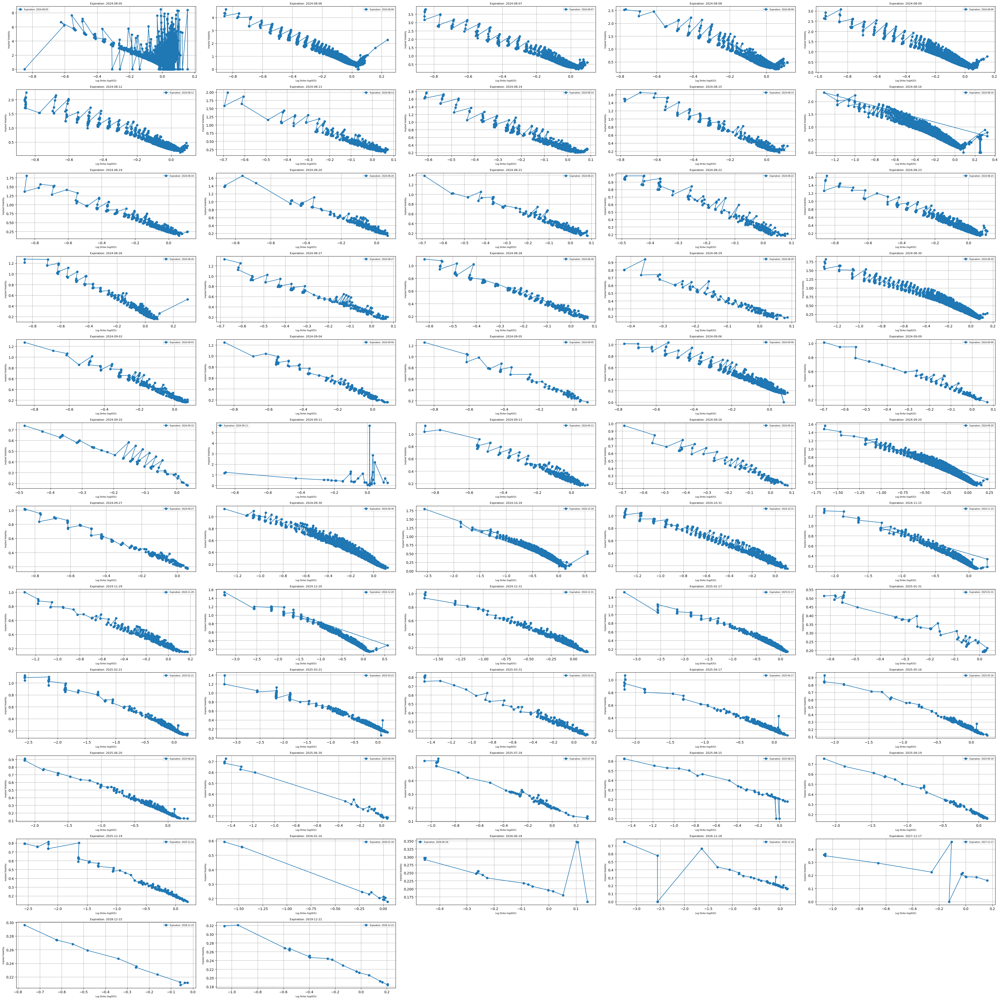

In [16]:
# 만기일을 기준으로 그룹화
grouped =options_traded_put.groupby('expiration')

# 총 그래프 개수 설정
n_groups = len(grouped)
ncols = 5
nrows = (n_groups // ncols) + (n_groups % ncols > 0)

# 플롯 크기 설정
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 40))
axes = axes.flatten()  # 그래프를 1D 배열로 변환

# 각 그룹별로 개별 그래프 생성
for i, (name, group) in enumerate(grouped):
    ax = axes[i]
    ax.plot(group['log_strike'], group['implied_volatility'], marker='o', linestyle='-', label=f'Expiration: {name}')
    ax.set_title(f'Expiration: {name}', fontsize=8)
    ax.set_xlabel('Log Strike (log(K/S))', fontsize=6)
    ax.set_ylabel('Implied Volatility', fontsize=6)
    ax.grid(True)
    ax.legend(fontsize=6)

# 남는 플롯은 빈 화면으로 설정
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


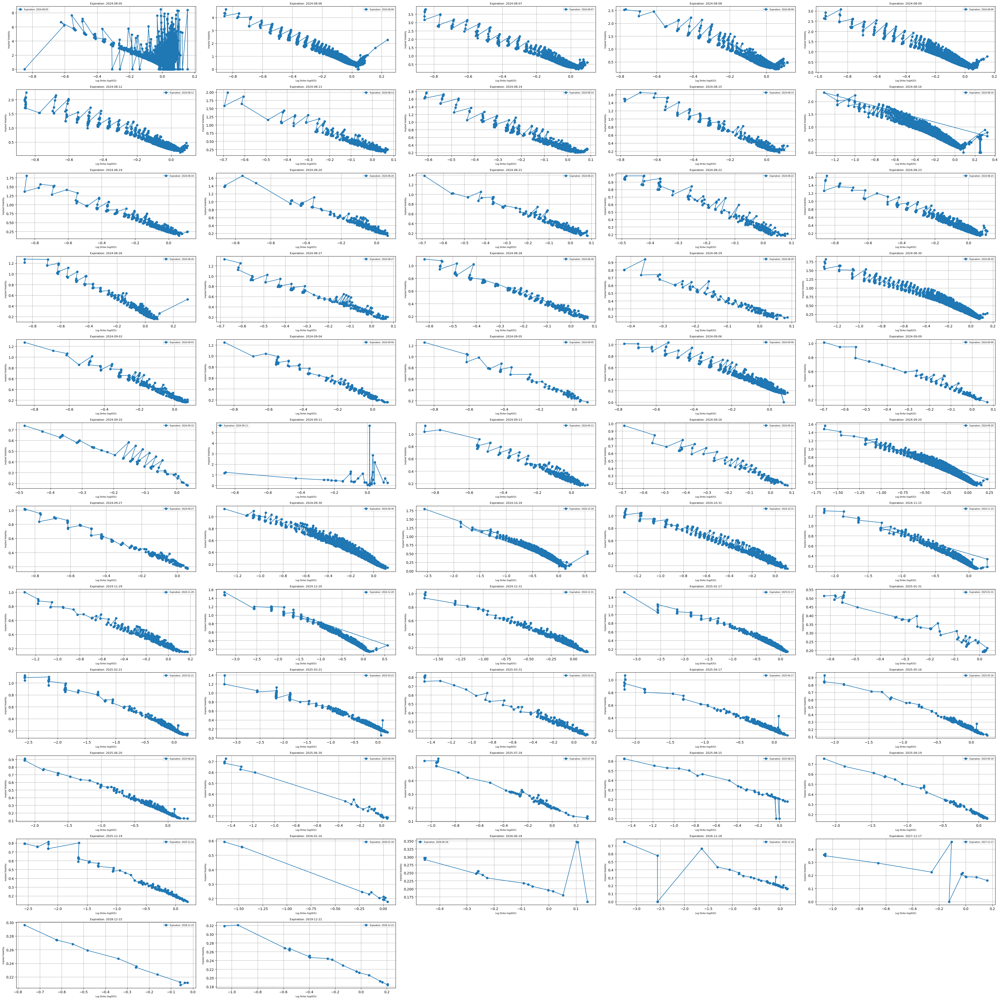

In [17]:
# 거래량이 가장 많은 만기일 추출
top_expirations = options_traded_put.groupby('expiration')['trade_volume'].sum().nlargest(5).index

# 중요 만기일만 선택해서 다시 시각화
grouped_filtered = options_traded_put[options_traded_put['expiration'].isin(top_expirations)].groupby('expiration')

# 총 그래프 개수 설정
n_groups = len(grouped)
ncols = 5
nrows = (n_groups // ncols) + (n_groups % ncols > 0)

# 플롯 크기 설정
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 40))
axes = axes.flatten()  # 그래프를 1D 배열로 변환

# 각 그룹별로 개별 그래프 생성
for i, (name, group) in enumerate(grouped):
    ax = axes[i]
    ax.plot(group['log_strike'], group['implied_volatility'], marker='o', linestyle='-', label=f'Expiration: {name}')
    ax.set_title(f'Expiration: {name}', fontsize=8)
    ax.set_xlabel('Log Strike (log(K/S))', fontsize=6)
    ax.set_ylabel('Implied Volatility', fontsize=6)
    ax.grid(True)
    ax.legend(fontsize=6)

# 남는 플롯은 빈 화면으로 설정
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


## 거래량 기준으로 outlier 제거 후 그리기

그려보니까 너무 울퉁불퉁함...  
만기일 기준으로 분류했을 때, 거래량이 많은 경우에 대해서만 변동성 미소를 그려야함  
그래서 몇 거래량을 기준으로 잡아야할지 정해야함  
평균 이상인 거 대상으로 하거나, 너무 많다 싶으면 상위 25%로 가도될듯  

In [18]:
options_traded_call['trade_volume'].describe()

count    64248.000000
mean        18.379794
std         73.695446
min          1.000000
25%          1.000000
50%          3.000000
75%         12.000000
max       4010.000000
Name: trade_volume, dtype: float64

중앙값이 3인데 평균이 18이고 최대값이 4010까지 있으니까 왜도(skew)가 있음을 확인 가능

우선 히스토그램을 그려서 확인해보자

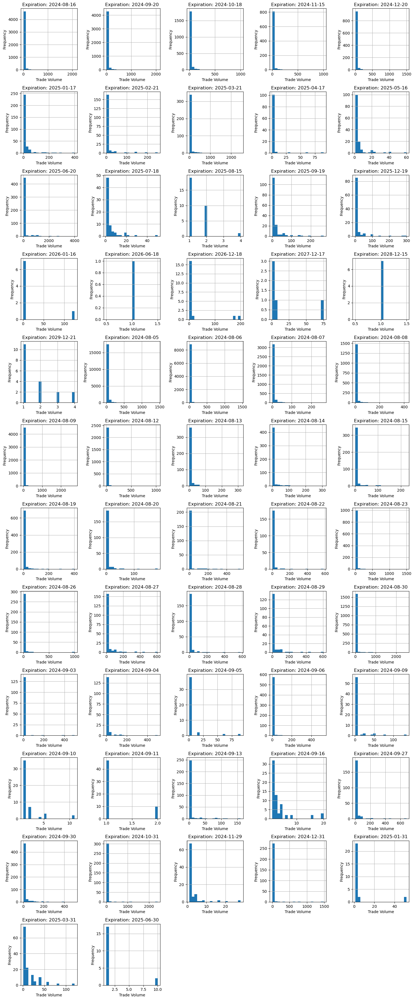

In [19]:
import math

expiration_dates = options_traded_call['expiration'].unique()

num_plots = len(expiration_dates)
cols = 5  
rows = math.ceil(num_plots / cols) 

plt.figure(figsize=(15, rows * 3))

for i, expiration in enumerate(expiration_dates, 1):
    plt.subplot(rows, cols, i)  
    options_traded_call[options_traded_call['expiration'] == expiration]['trade_volume'].hist(bins=20)
    plt.title(f'Expiration: {expiration}')
    plt.xlabel('Trade Volume')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


### IQR method

In [20]:
def filter_significant_volume(df):
    q1 = df['trade_volume'].quantile(0.25)
    q3 = df['trade_volume'].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return df[(df['trade_volume'] >= lower_bound) & (df['trade_volume'] <= upper_bound)]


options_traded_call_iqr = options_traded_call.groupby('expiration').apply(filter_significant_volume).reset_index(drop=True)
options_traded_put_iqr = options_traded_put.groupby('expiration').apply(filter_significant_volume).reset_index(drop=True)

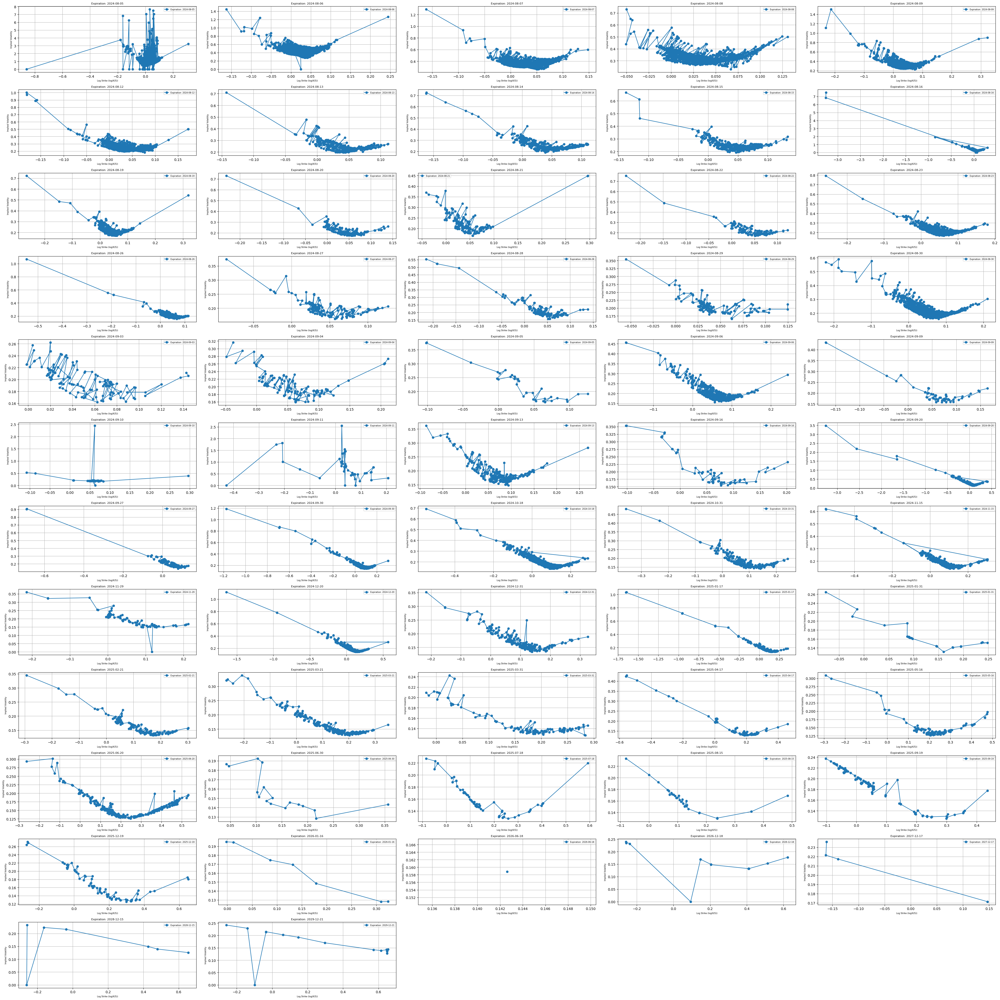

In [21]:
# 만기일을 기준으로 그룹화
grouped =options_traded_call_iqr.groupby('expiration')

# 총 그래프 개수 설정
n_groups = len(grouped)
ncols = 5
nrows = (n_groups // ncols) + (n_groups % ncols > 0)

# 플롯 크기 설정
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 40))
axes = axes.flatten()  # 그래프를 1D 배열로 변환

# 각 그룹별로 개별 그래프 생성
for i, (name, group) in enumerate(grouped):
    ax = axes[i]
    ax.plot(group['log_strike'], group['implied_volatility'], marker='o', linestyle='-', label=f'Expiration: {name}')
    ax.set_title(f'Expiration: {name}', fontsize=8)
    ax.set_xlabel('Log Strike (log(K/S))', fontsize=6)
    ax.set_ylabel('Implied Volatility', fontsize=6)
    ax.grid(True)
    ax.legend(fontsize=6)

# 남는 플롯은 빈 화면으로 설정
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


동성 스마일이 다소 매끄러워졌지만, 여전히 일부 만기일에서 울퉁불퉁한 부분이 남아 있다.... 특히 거래량이 극단적으로 낮은 구간에서 변동성이 급격히 변하는 모습을 완전히 제거하지는 못하는 것 같다

아무튼 뭔가 영 별로임 다른 방법을 시도해보자

### MAD 기반 방법(Modified Z-score)

In [22]:
def mad_based_filter(df, threshold=3.5):
    median_trade_volume = df['trade_volume'].median()
    mad = np.median(np.abs(df['trade_volume'] - median_trade_volume))
    modified_z_score = 0.6745 * (df['trade_volume'] - median_trade_volume) / mad
    return df[np.abs(modified_z_score) <= threshold]

options_traded_call_mad = options_traded_call.groupby('expiration').apply(mad_based_filter).reset_index(drop=True)
options_traded_put_mad = options_traded_put.groupby('expiration').apply(mad_based_filter).reset_index(drop=True)


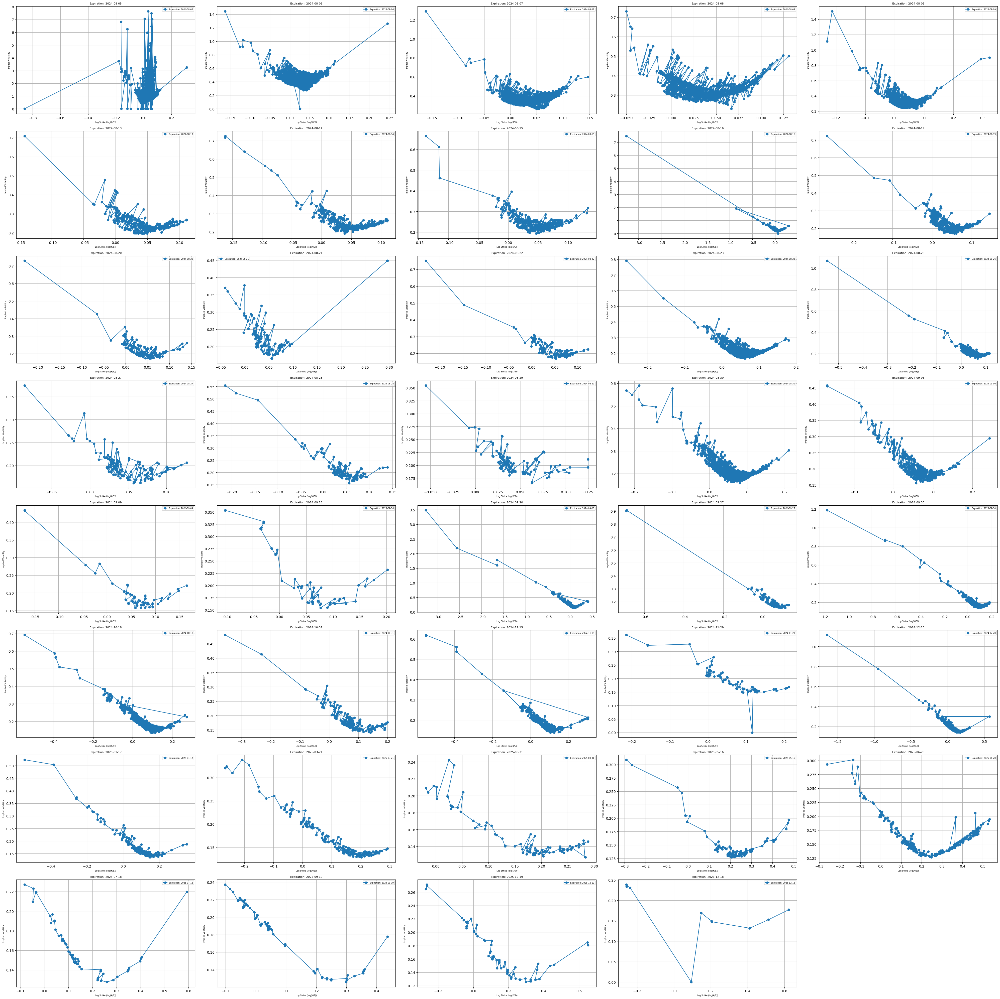

In [23]:
# 만기일을 기준으로 그룹화
grouped =options_traded_call_mad.groupby('expiration')

# 총 그래프 개수 설정
n_groups = len(grouped)
ncols = 5
nrows = (n_groups // ncols) + (n_groups % ncols > 0)

# 플롯 크기 설정
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 40))
axes = axes.flatten()  # 그래프를 1D 배열로 변환

# 각 그룹별로 개별 그래프 생성
for i, (name, group) in enumerate(grouped):
    ax = axes[i]
    ax.plot(group['log_strike'], group['implied_volatility'], marker='o', linestyle='-', label=f'Expiration: {name}')
    ax.set_title(f'Expiration: {name}', fontsize=8)
    ax.set_xlabel('Log Strike (log(K/S))', fontsize=6)
    ax.set_ylabel('Implied Volatility', fontsize=6)
    ax.grid(True)
    ax.legend(fontsize=6)

# 남는 플롯은 빈 화면으로 설정
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


대부분의 만기일에서 변동성 스마일이 IQR에 비해 더 매끄럽고 안정적인 모습을 보여준다. 특히 거래량이 극단적으로 낮은 데이터 포인트가 적절히 제거되어 변동성 스마일의 전체적인 구조를 파악하기 쉬워보인다(상대적으로)

그치만 이것도 맘에 별로 안 듦..... 마지막 트라이 간다

### Isolation Forest

In [24]:
from sklearn.ensemble import IsolationForest

def isolation_forest_filter(df, contamination=0.1):
    # Isolation Forest model
    iso_forest = IsolationForest(contamination=contamination, random_state=42)
    
    volume = df[['trade_volume']].values.reshape(-1, 1)
    # 모델 피팅 및 예측 (1: inliers, -1: outliers)
    df['anomaly'] = iso_forest.fit_predict(volume)
    # inliers만 출력
    return df[df['anomaly'] == 1].drop(columns=['anomaly'])


options_traded_call_iso = options_traded_call.groupby('expiration').apply(isolation_forest_filter).reset_index(drop=True)
options_traded_put_iso = options_traded_put.groupby('expiration').apply(isolation_forest_filter).reset_index(drop=True)


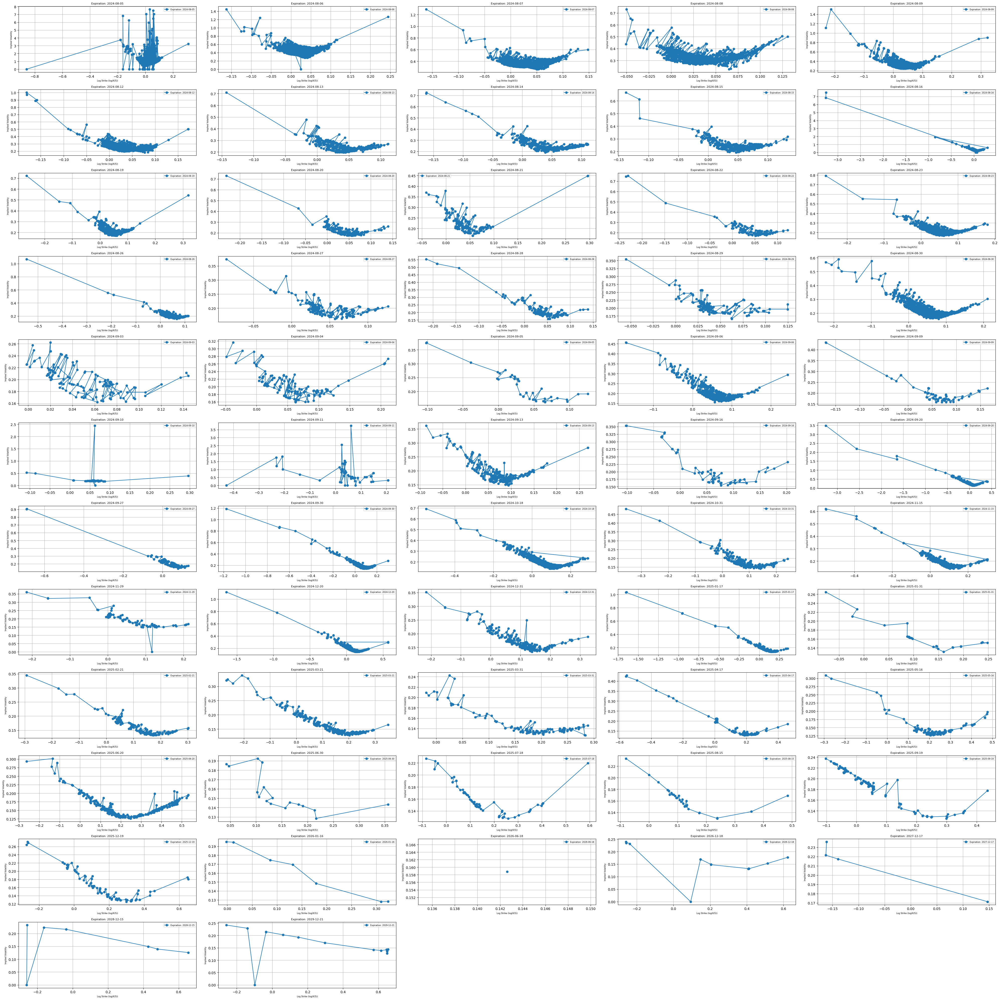

In [25]:
# 만기일을 기준으로 그룹화
grouped =options_traded_call_iso.groupby('expiration')

# 총 그래프 개수 설정
n_groups = len(grouped)
ncols = 5
nrows = (n_groups // ncols) + (n_groups % ncols > 0)

# 플롯 크기 설정
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 40))
axes = axes.flatten()  # 그래프를 1D 배열로 변환

# 각 그룹별로 개별 그래프 생성
for i, (name, group) in enumerate(grouped):
    ax = axes[i]
    ax.plot(group['log_strike'], group['implied_volatility'], marker='o', linestyle='-', label=f'Expiration: {name}')
    ax.set_title(f'Expiration: {name}', fontsize=8)
    ax.set_xlabel('Log Strike (log(K/S))', fontsize=6)
    ax.set_ylabel('Implied Volatility', fontsize=6)
    ax.grid(True)
    ax.legend(fontsize=6)

# 남는 플롯은 빈 화면으로 설정
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


특정 만기일에서 변동성 스마일이 지나치게 매끄럽거나 데이터 포인트가 많이 제거되어 구조가 크게 변형된 것으로 보인다. 거래량이 많은 부분까지 이상치로 감지하여 제거했을 수도 있을 것 같다..! 일부 만기일에서는 변동성 스마일의 중요한 특징이 손실된 듯 보이기도..

결론: 거래량 영향을 적절히 고려하면서 이상치 제거하고 싶으면 MAD 방법을 우선적으로 사용하는 게 좋을듯함.. 근데 무작정 MAD만 쓰는 것보다는 IQR 적용해서 전체 분포의 극단적 이상치 먼저 제거하고, MAD를 이후에 적용해서 남은 데이터를 미세하기 정제하는 느낌으로다가 ㅇㅇ

In [26]:
options_traded_call_filtered = options_traded_call_iqr.groupby('expiration').apply(mad_based_filter).reset_index(drop=True)
options_traded_put_filtered = options_traded_put_iqr.groupby('expiration').apply(mad_based_filter).reset_index(drop=True)

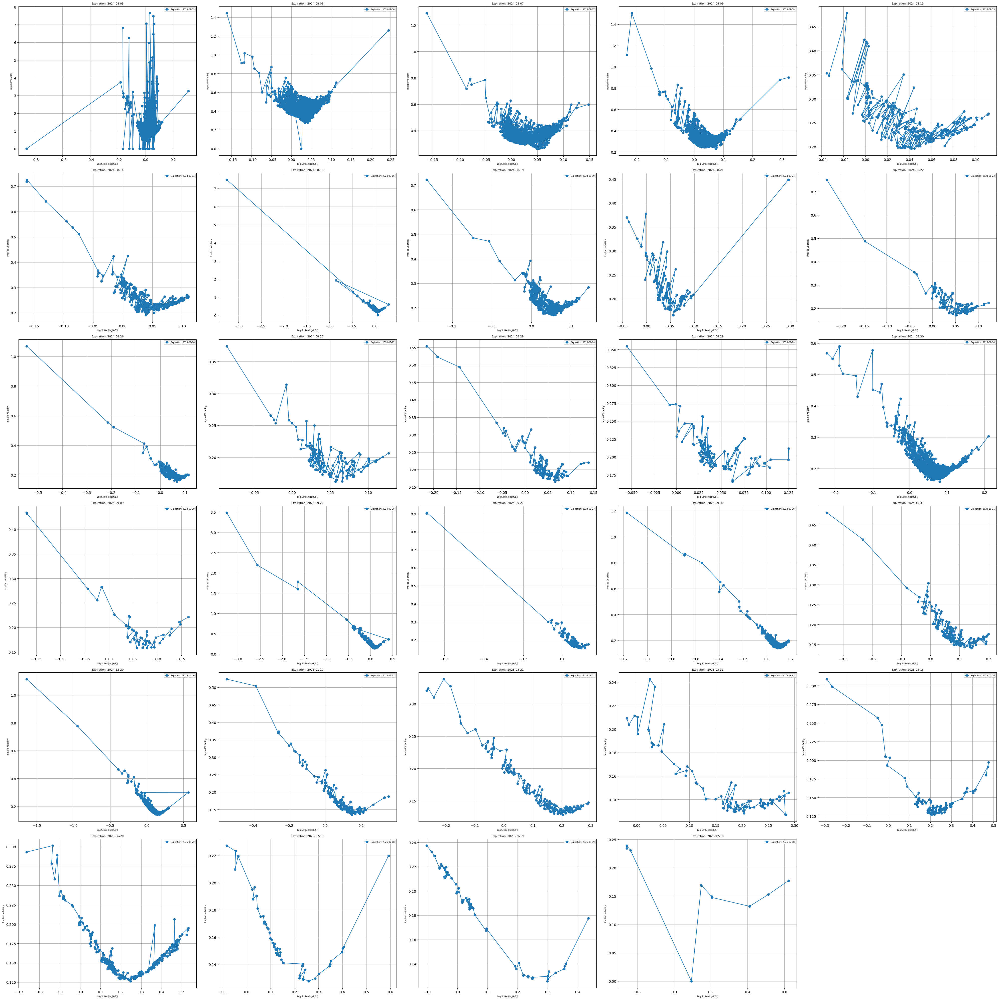

In [27]:
# 만기일을 기준으로 그룹화
grouped =options_traded_call_filtered.groupby('expiration')

# 총 그래프 개수 설정
n_groups = len(grouped)
ncols = 5
nrows = (n_groups // ncols) + (n_groups % ncols > 0)

# 플롯 크기 설정
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 40))
axes = axes.flatten()  # 그래프를 1D 배열로 변환

# 각 그룹별로 개별 그래프 생성
for i, (name, group) in enumerate(grouped):
    ax = axes[i]
    ax.plot(group['log_strike'], group['implied_volatility'], marker='o', linestyle='-', label=f'Expiration: {name}')
    ax.set_title(f'Expiration: {name}', fontsize=8)
    ax.set_xlabel('Log Strike (log(K/S))', fontsize=6)
    ax.set_ylabel('Implied Volatility', fontsize=6)
    ax.grid(True)
    ax.legend(fontsize=6)

# 남는 플롯은 빈 화면으로 설정
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


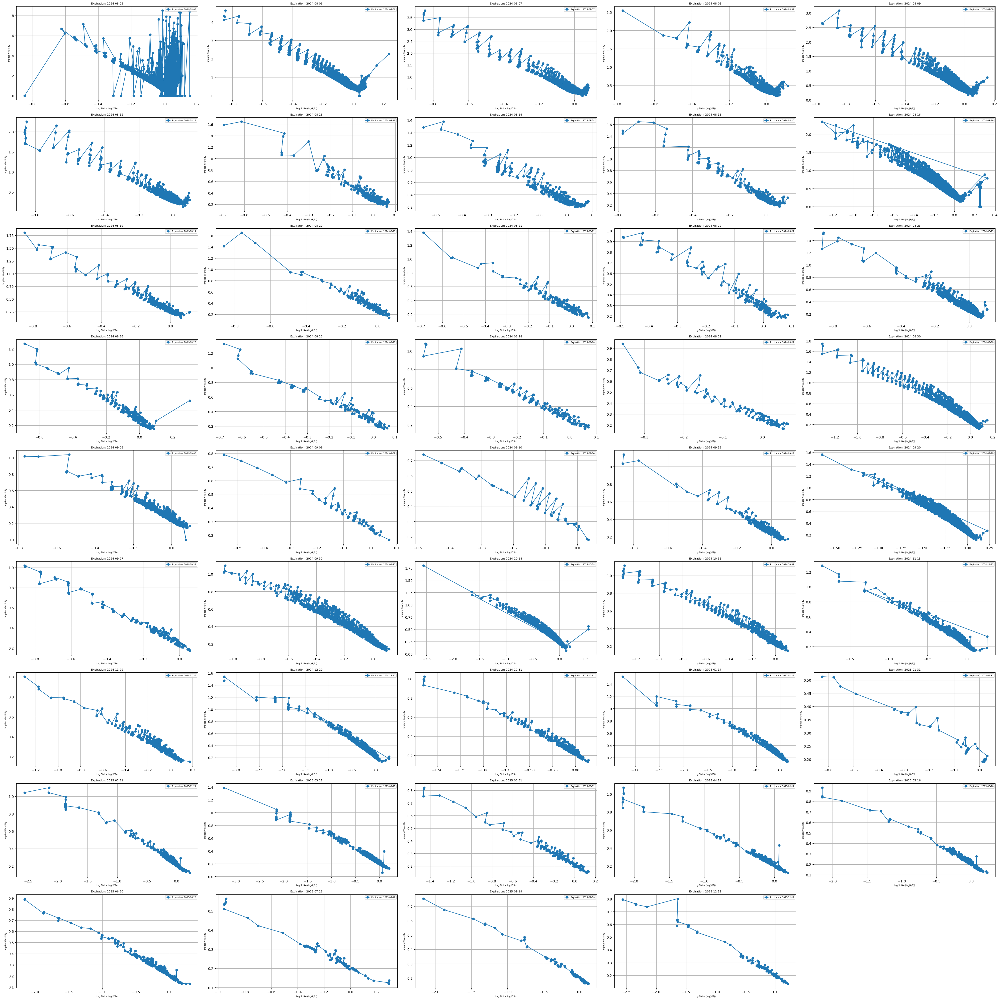

In [28]:
# 만기일을 기준으로 그룹화
grouped =options_traded_put_filtered.groupby('expiration')

# 총 그래프 개수 설정
n_groups = len(grouped)
ncols = 5
nrows = (n_groups // ncols) + (n_groups % ncols > 0)

# 플롯 크기 설정
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 40))
axes = axes.flatten()  # 그래프를 1D 배열로 변환

# 각 그룹별로 개별 그래프 생성
for i, (name, group) in enumerate(grouped):
    ax = axes[i]
    ax.plot(group['log_strike'], group['implied_volatility'], marker='o', linestyle='-', label=f'Expiration: {name}')
    ax.set_title(f'Expiration: {name}', fontsize=8)
    ax.set_xlabel('Log Strike (log(K/S))', fontsize=6)
    ax.set_ylabel('Implied Volatility', fontsize=6)
    ax.grid(True)
    ax.legend(fontsize=6)

# 남는 플롯은 빈 화면으로 설정
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [29]:
options_traded_call_filtered.to_csv('options_traded_call_filtered', index = False)
options_traded_put_filtered.to_csv('options_traded_put_filtered', index = False)

In [30]:
options_traded_call_filtered.shape

(41936, 26)

In [31]:
options_traded_put_filtered.shape

(72935, 26)

## IQR로 지울 때 상방은 만들지 말고 하방만 만들자! 거래량 많은 건 유의미한 데이터일 테니까 굳이 지울 필요 없을 것 같다

In [32]:
def filter_significant_volume(df):
    q1 = df['trade_volume'].quantile(0.25)
    q3 = df['trade_volume'].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    return df[(df['trade_volume'] >= lower_bound)]


options_traded_call_iqr_2 = options_traded_call.groupby('expiration').apply(filter_significant_volume).reset_index(drop=True)
options_traded_put_iqr_2 = options_traded_put.groupby('expiration').apply(filter_significant_volume).reset_index(drop=True)

In [33]:
def mad_based_filter(df, threshold=3.5):
    median_trade_volume = df['trade_volume'].median()
    mad = np.median(np.abs(df['trade_volume'] - median_trade_volume))
    modified_z_score = 0.6745 * (df['trade_volume'] - median_trade_volume) / mad
    return df[np.abs(modified_z_score) <= threshold]

options_traded_call_mad_2 = options_traded_call_iqr_2.groupby('expiration').apply(mad_based_filter).reset_index(drop=True)
options_traded_put_mad_2 = options_traded_put_iqr_2.groupby('expiration').apply(mad_based_filter).reset_index(drop=True)


In [34]:
options_traded_call_mad_2.shape

(48111, 26)

In [35]:
options_traded_put_mad_2.shape

(78150, 26)

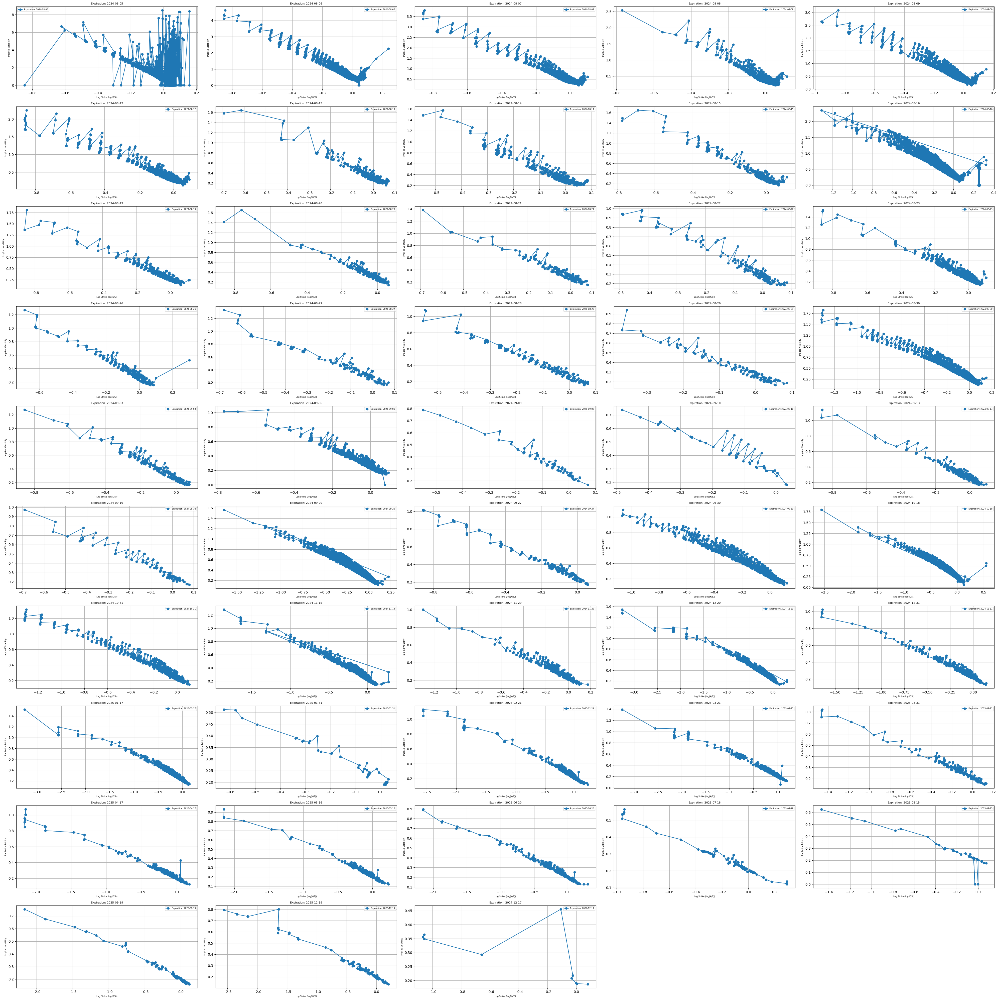

In [36]:
# 만기일을 기준으로 그룹화
grouped =options_traded_put_mad_2.groupby('expiration')

# 총 그래프 개수 설정
n_groups = len(grouped)
ncols = 5
nrows = (n_groups // ncols) + (n_groups % ncols > 0)

# 플롯 크기 설정
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 40))
axes = axes.flatten()  # 그래프를 1D 배열로 변환

# 각 그룹별로 개별 그래프 생성
for i, (name, group) in enumerate(grouped):
    ax = axes[i]
    ax.plot(group['log_strike'], group['implied_volatility'], marker='o', linestyle='-', label=f'Expiration: {name}')
    ax.set_title(f'Expiration: {name}', fontsize=8)
    ax.set_xlabel('Log Strike (log(K/S))', fontsize=6)
    ax.set_ylabel('Implied Volatility', fontsize=6)
    ax.grid(True)
    ax.legend(fontsize=6)

# 남는 플롯은 빈 화면으로 설정
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


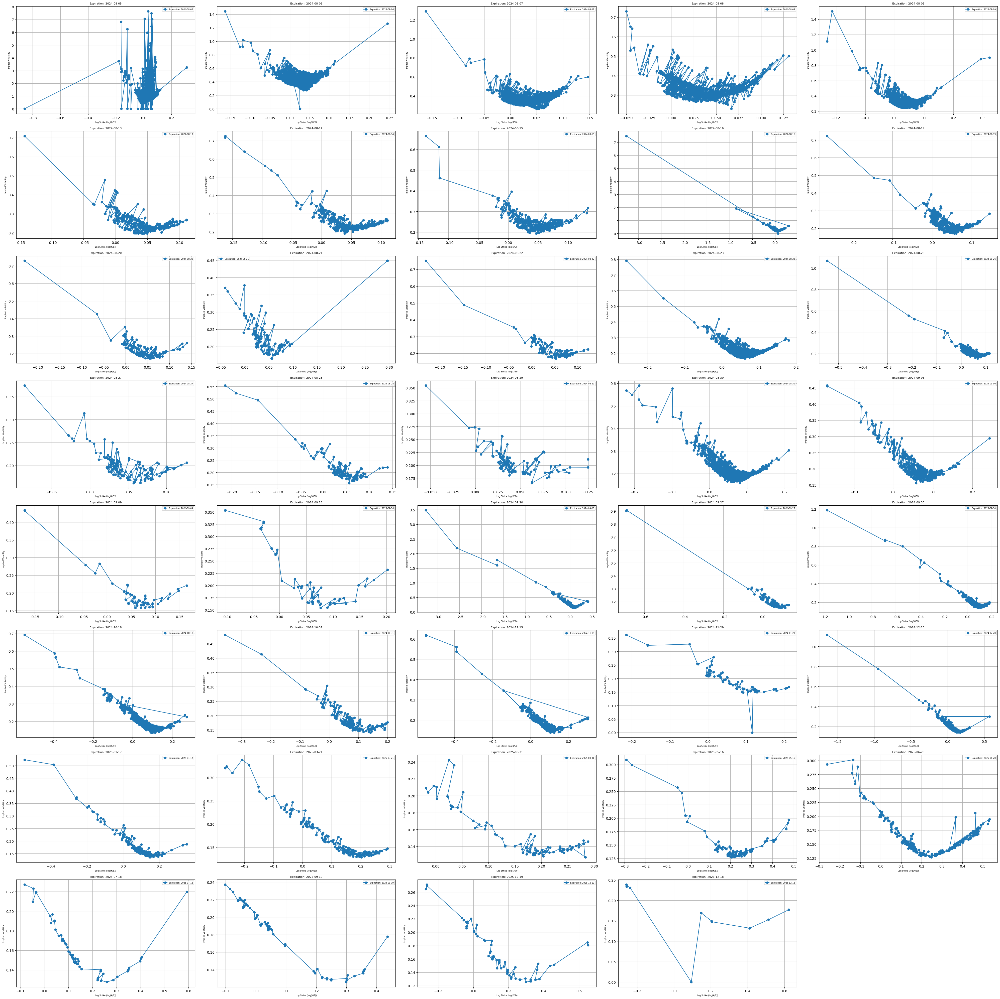

In [37]:
# 만기일을 기준으로 그룹화
grouped =options_traded_call_mad_2.groupby('expiration')

# 총 그래프 개수 설정
n_groups = len(grouped)
ncols = 5
nrows = (n_groups // ncols) + (n_groups % ncols > 0)

# 플롯 크기 설정
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 40))
axes = axes.flatten()  # 그래프를 1D 배열로 변환

# 각 그룹별로 개별 그래프 생성
for i, (name, group) in enumerate(grouped):
    ax = axes[i]
    ax.plot(group['log_strike'], group['implied_volatility'], marker='o', linestyle='-', label=f'Expiration: {name}')
    ax.set_title(f'Expiration: {name}', fontsize=8)
    ax.set_xlabel('Log Strike (log(K/S))', fontsize=6)
    ax.set_ylabel('Implied Volatility', fontsize=6)
    ax.grid(True)
    ax.legend(fontsize=6)

# 남는 플롯은 빈 화면으로 설정
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [38]:
options_traded_call_mad_2.to_csv('data_call.csv')
options_traded_put_mad_2.to_csv('data_put.csv')